# Avance 1. Análisis exploratorio de datos

INSTITUTO TECNOLÓGICO Y DE ESTUDIOS SUPERIORES DE MONTERREY

TC5035 - Proyecto Integrador

**Integrantes**

- DOMÉNICO MORALES ORTIZ 		A00820324

- MÓNICA DODERO ARROYO		    A01795330

- OSCAR ANTONIO SUÁREZ V 	    A01323987


**Equipo docente**
- Dra. Grettel Barceló Alonso

- Dr. Luis Eduardo Falcón Morales

- Mtra. Verónica Sandra Guzmán de Valle

## Instalación de módulos y referencias de librerías

In [4]:
!pip install astropy
!pip install kaggle

In [5]:
from google.colab import drive
from google.colab import userdata
import os
import cv2
import json
import kagglehub
import numpy as np
import pandas as pd
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
from collections import defaultdict
from torchvision import transforms
from astropy.io import fits
from astropy.visualization import ZScaleInterval, LogStretch, MinMaxInterval, LinearStretch
from astropy.visualization import make_lupton_rgb

In [6]:
# Se necesita montar el drive y acceder a la carpeta donde están los archivos
drive.mount('/content/drive')

# Añadir las credenciales para usar Kaggle API
os.environ['KAGGLE_USERNAME'] = userdata.get('KAGGLE_USERNAME')
os.environ['KAGGLE_KEY'] = userdata.get('KAGGLE_KEY')

# Descargar los datos de Kaggle
path = kagglehub.dataset_download("domenicomoralesortiz/fits-sdss-4class", )

print("Path to dataset files:", path)

Mounted at /content/drive


100%|██████████| 25.2G/25.2G [05:05<00:00, 88.6MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/domenicomoralesortiz/fits-sdss-4class/versions/1


In [8]:
# Direcciones a partir de la descarga
DOWNLOAD_PATH = Path(path) / "ls_dr10_cutouts_combined"
FITS_PATH = DOWNLOAD_PATH / "fits"
CSV_PATH = DOWNLOAD_PATH / "lsdr10_paths.csv"

print("FITS path:", FITS_PATH)
print("CSV path:", CSV_PATH)

FITS path: /root/.cache/kagglehub/datasets/domenicomoralesortiz/fits-sdss-4class/versions/1/ls_dr10_cutouts_combined/fits
CSV path: /root/.cache/kagglehub/datasets/domenicomoralesortiz/fits-sdss-4class/versions/1/ls_dr10_cutouts_combined/lsdr10_paths.csv


## Exploración general del dataset ✨

El dataset construido para uso en este análisis comprende un conjunto de imágenes de galaxias 🌌 centradas mediante sus coordenadas de Ascensión Recta (RA) y Declinación (DEC) que se encuentran en el archivo csv proporcionado, utilizando únicamente las clases relevantes:

*   **none:** galaxia sin anillo
*   **inner:** galaxia con anillo interno
*   **outer:** galaxia con anillo externo
*   **inner+outer:** galaxio con anillo interno y externo

Estas imágenes fueron adquiridas a través de solicitudes a la API de DESI Legacy Imaging Surveys, especificando los siguientes parámetros para asegurar la consistencia y relevancia de los datos:

*   **Capa de datos (layer):** ls-dr10 ✨
*   **Escala de arcsec/pix (pixscale):** 0.262 📐
*   **Tamaño de imagen (size):** 512x512 píxeles 🖼️
*   **Bandas espectrales (bands):** griz 🌈

Un ejemplo ilustrativo de la estructura de las solicitudes empleadas es el siguiente:

> `https://www.legacysurvey.org/viewer/fits-cutout?ra=243.708880&dec=-0.915654&layer=ls-dr10&pixscale=0.262&size=512&bands=griz`

Se puede encontrar la ejecución de este proceso en paralelo en el Jupyter Notebook "Construcción del dataset". 🛠️

### Análisis de clases
Haciendo un primer análisis del conjunto de datos construido, podemos extraer la distribución de clases con apoyo del archivo csv para comprender mejor su composición. 📊🔍

ring_type
none           6660
inner           857
inner+outer     372
outer           186
Name: count, dtype: int64


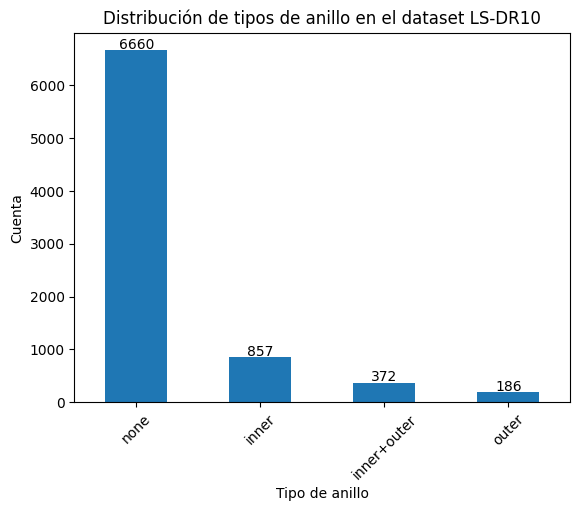

In [113]:
# Leer el archivo csv que contiene los nombres de archivo, ra, dec y tipo de anillo
df = pd.read_csv(CSV_PATH)

# Obtener lista de tipos de anillo
RING_TYPE = list(df["ring_type"].unique())

# Mostrar la cuenta de galaxias según su tipo de anillo
print(df["ring_type"].value_counts())

# Graficar al distribución de tipos de anillo
df["ring_type"].value_counts().plot(kind="bar")
plt.xlabel("Tipo de anillo")
plt.ylabel("Cuenta")
plt.title("Distribución de tipos de anillo en el dataset LS-DR10")
plt.xticks(rotation=45)

# Anotar la cantidad encima de cada columna
for i, v in enumerate(df["ring_type"].value_counts()):
    plt.text(i, v + 25, str(v), ha='center')

# Mostrar la gráfica
plt.show()

### Visualización de datos
Haciendo una reconstrucción de imágen RGB utilizando las bandas g, r y z, podemos visualizar ejemplos de galaxias por cada clase.

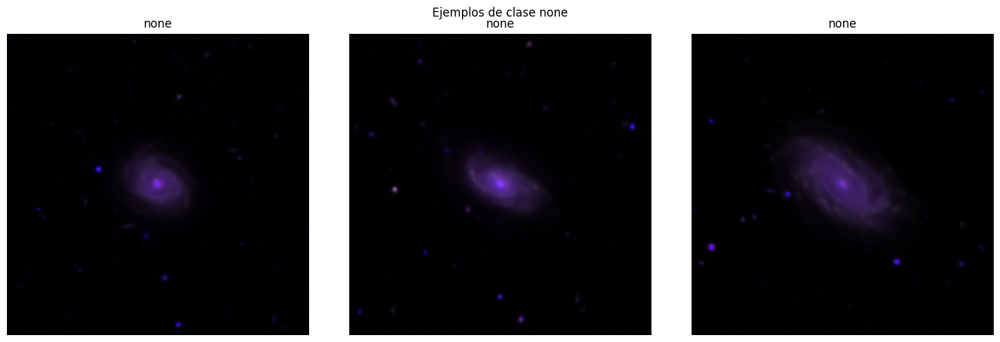

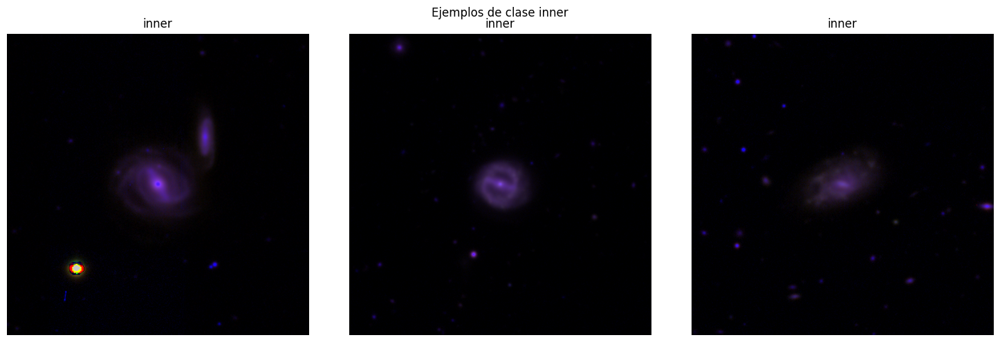

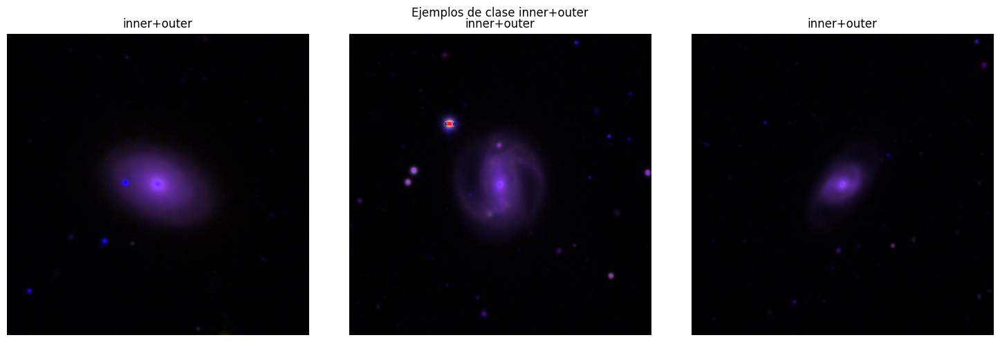

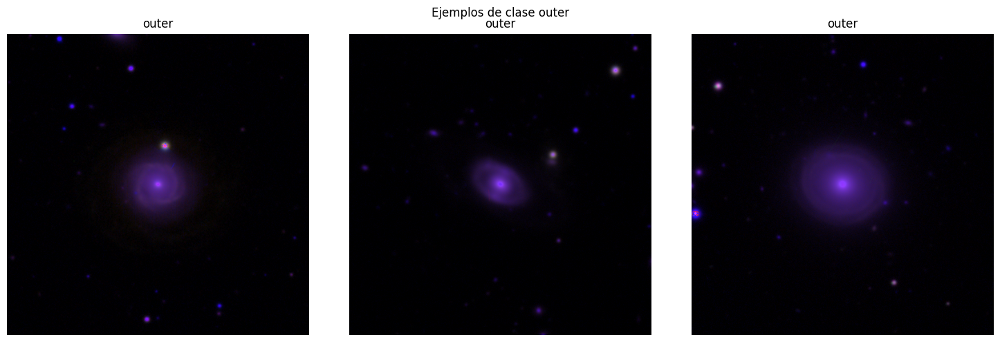

In [115]:
def channels_to_rgb(r, g, z):
    """ Convertir los canales en una imágen RGB compuesta.

    Args:
        r (np.ndarray): Canal rojo.
        g (np.ndarray): Canal verde.
        z (np.ndarray): Canal azul.

    Returns:
        np.ndarray: Imagen RGB compuesta.
    """
    # Se utiliza la función make_lupton_rgb debido a que ayuda
    # a manejar el alto rango de imágenes astronómicas controlando
    # el contraste y la saturación, manteniendo el color.
    rgb_img = make_lupton_rgb(r, g, z, stretch=0.5, Q=8)
    return rgb_img

def plot_rgb_sample_images(dataset_path, samples_per_class=3):
  """ Visualizar ejemplos de cada clase en formato RGB según sea indicado.

  Args:
      dataset_path (Path): Ruta al dataset.
      samples_per_class (int): Número de imágenes a mostrar por clase.
  """
  # Por cada clase
  for class_name in RING_TYPE:
    # Obtener lista de los archivos de la clase
    ring_type_files = list(FITS_PATH.glob(f"*_{class_name}_*.fits"))
    # Obtener una muestra aleatoria
    sample_files = np.random.choice(ring_type_files,
                                    size=min(samples_per_class, len(ring_type_files)),
                                    replace=False)
    fig, axs = plt.subplots(1, samples_per_class, figsize=(5 * samples_per_class, 5))
    # Por cada archivo fits, abrirlo
    for i, fits_file in enumerate(sample_files):
        with fits.open(fits_file) as hdul:
            data = hdul[0].data # Extraer los datos
            rgb_img = channels_to_rgb(data[1], data[0], data[3])  # Convertir a RGB
            # Mostrar la imagen RGB
            axs[i].imshow(rgb_img, origin='lower')
            axs[i].set_title(f"{class_name}")
            axs[i].axis('off')
    plt.suptitle(f"Ejemplos de clase {class_name}")
    plt.tight_layout()
    plt.show()

plot_rgb_sample_images(FITS_PATH)


De igual manera, podemos visualizar ejemplos de cada clase según las bandas g, r, i y z.

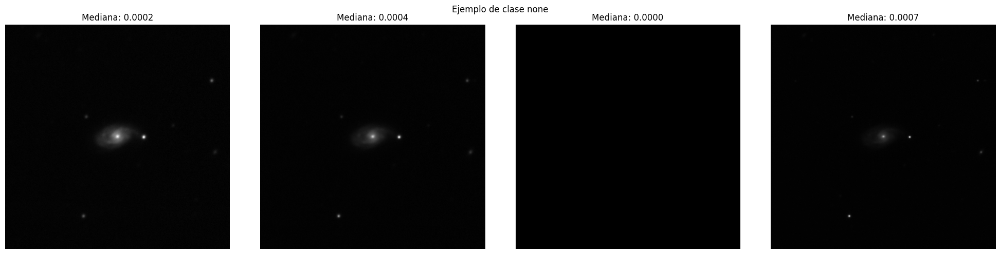

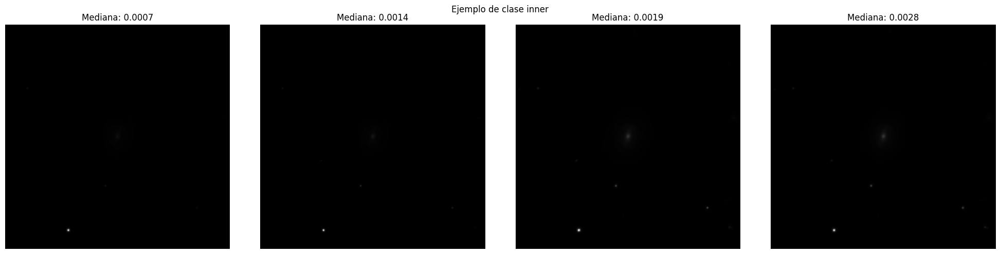

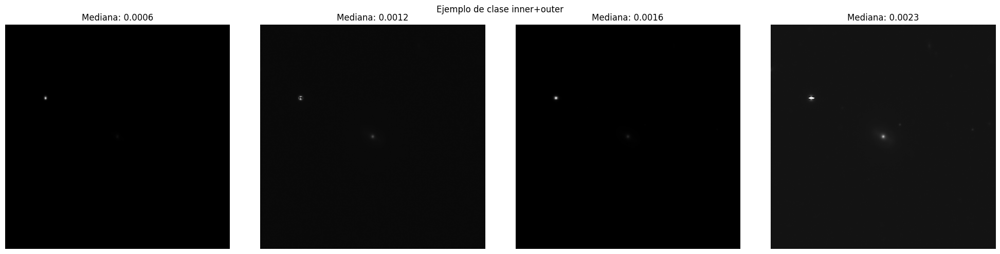

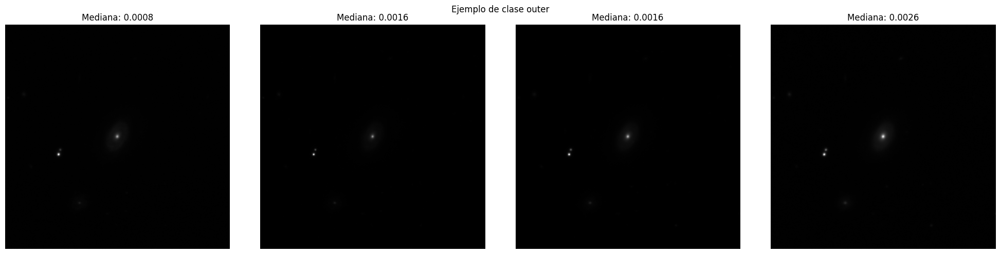

In [116]:
def plot_channels_sample_image(dataset_path, transforms=None, med_val=None):
  """ Visualizar los canales de un ejemplo de cada clase.

  Args:
      dataset_path (Path): Ruta al dataset.
      transforms (callable, optional): Transformaciones a aplicar a las imágenes.
  """
  # Por cada clase
  for class_name in RING_TYPE:
    # Obtener lista de los archivos de la clase
    ring_type_files = list(FITS_PATH.glob(f"*_{class_name}_*.fits"))
    # Obtener una muestra aleatoria
    sample_files = np.random.choice(ring_type_files,
                                    size=min(1, len(ring_type_files)),
                                    replace=False)
    fig, axs = plt.subplots(1, 4, figsize=(5 * 4, 5))
    # Por cada archivo fits, abrirlo
    for i, fits_file in enumerate(sample_files):
        with fits.open(fits_file) as hdul:
            data = hdul[0].data # Extraer los datos
            # Por cada canal
            for i in range(data.shape[0]):
              img = data[i].astype(np.float64)

              # Transformar si es necesario
              if transforms is not None:
                rendered_img = transforms(img, med_val=med_val)
              else:
                rendered_img = img

              # Mostrar la imagen
              axs[i].imshow(rendered_img, cmap='gray')
              axs[i].axis('off')
              axs[i].set_title(f"Mediana: {np.median(rendered_img):.4f}")

    plt.suptitle(f"Ejemplo de clase {class_name}")
    plt.tight_layout()
    plt.show()

plot_channels_sample_image(FITS_PATH)

## Transformaciones, estadísticas e histogramas 📈📊

Los histogramas son herramientas indispensables 🛠️ para ayudarnos a comprender la composición de las imágenes, evaluar los rangos y detectar señales clave. Los parámetros asociados a estas gráficas nos brindan una perspectiva valiosa del comportamiento de nuestro conjunto de datos. 🔍

Debido a la naturaleza del origen de los datos 🌌, la información crucial puede estar oculta detrás de ruido, saturación o bajo contraste. Por lo tanto, el uso de transformaciones es esencial para obtener una mejor visualización y analizar la distribución de intensidades de manera efectiva.

### Transformaciones

Se exploraron diversas transformaciones; sin embargo, la que generalmente proporciona una excelente visualización global es el uso de un estiramiento logarítmico. 📈

Este estiramiento permite hacer visibles detalles débiles y brillantes de manera simultánea, comprimiendo los picos de brillo intenso y estirando las sombras para revelar estructuras sutiles. Previamente a esto, es fundamental extraer límites de contraste adecuados y poder ignorar el ruido extremo que pueda distorsionar la información. 🔍

Finalmente, ajustamos la mediana de las imágenes resultantes para obtener uniformidad y consistencia entre todos los canales espectrales. Esto asegura que la comparación y el análisis visual sean más fiables. ✅

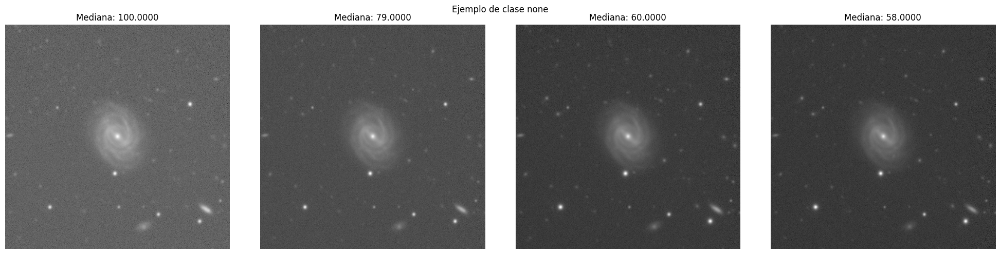

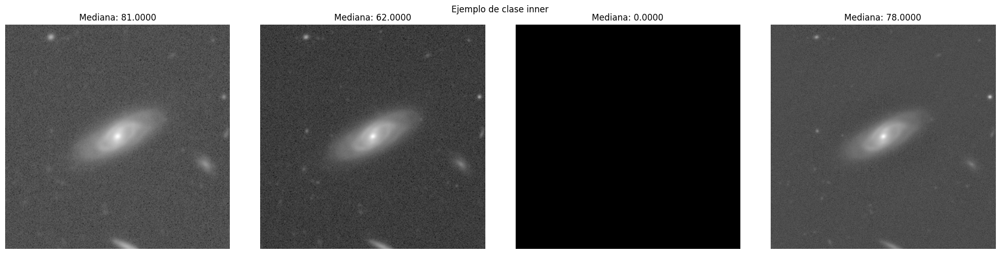

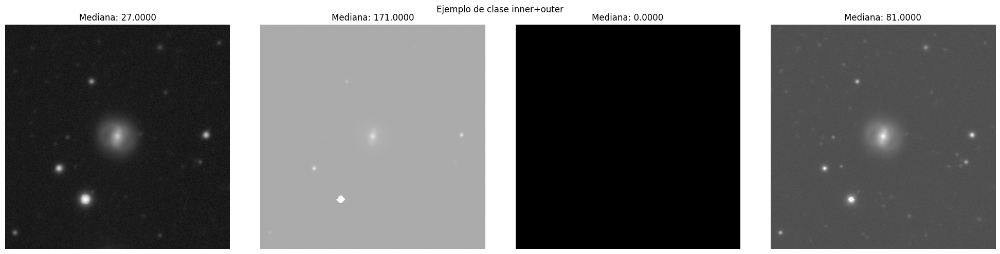

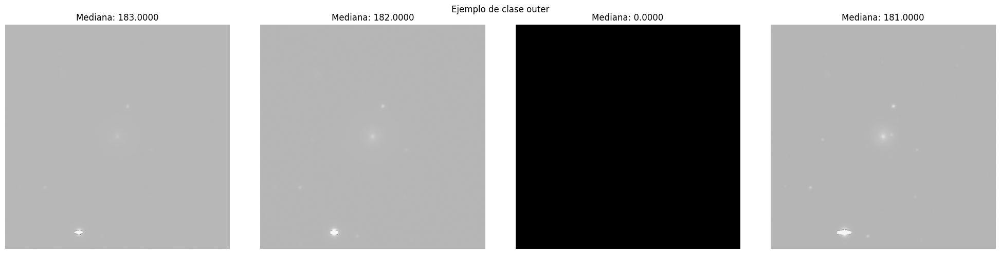

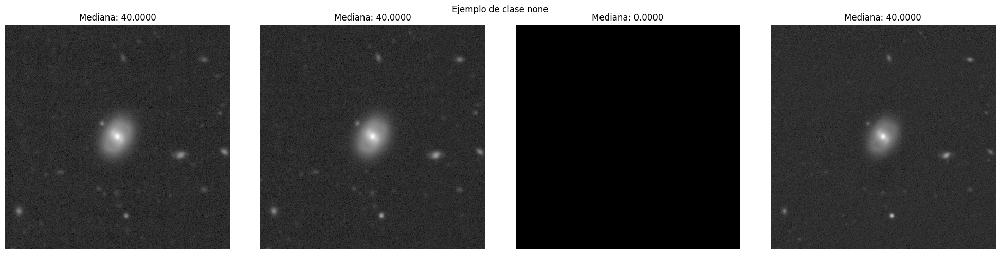

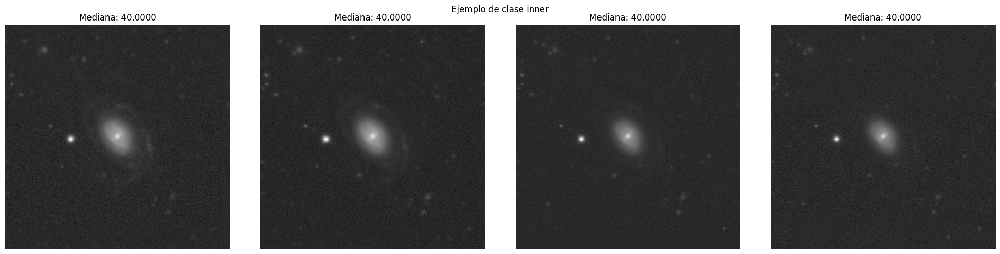

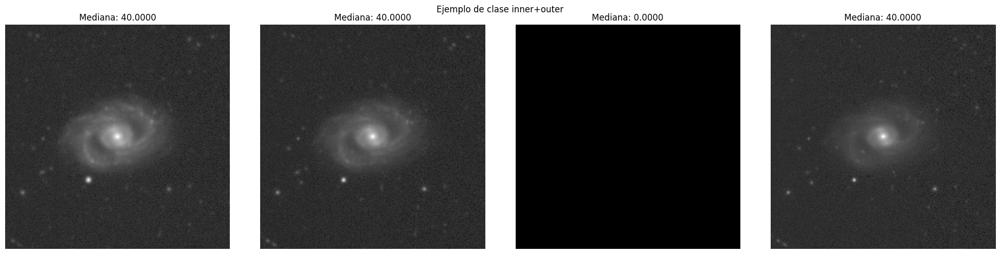

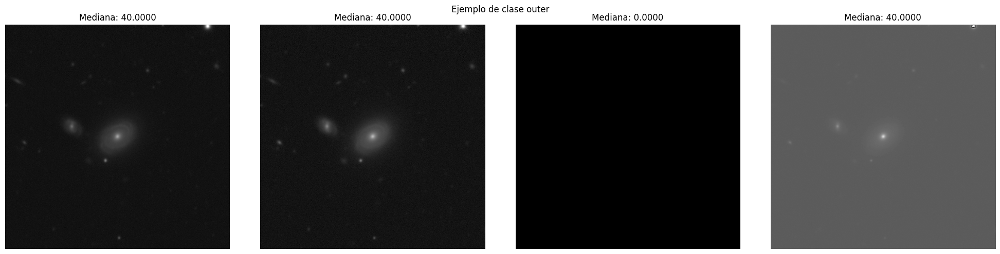

In [118]:
def log_n_scale_transform(img_data, log_a=1000, clip_mode='minmax', med_val=None):
    """
    Aplicar la transformación Log-N a una imagen usando escala Zscale o Min/Max.

    Pasos del proceso:
    1. Calcular los límites de intensidades.
    2. Normalizar los valores a un rango de 0 a 1.
    3. Aplicar la transformación Log-N.
    4. Escalar la imagen de vuelta al rango original.
    5. Modificar la mediana para mantener consistencia.

    Args:
      img_data (np.ndarray): Imagen de entrada.
      log_a (float): Factor de escala para la transformación Log-N.
      clip_mode (str): Modo de escala ('zscale' o 'minmax').

    Returns:
        np.ndarray: Imagen transformada.
    """
    img = img_data.astype(np.float64)

    # 1. Calcular los límites de intensidades según el método
    if clip_mode == 'zscale':
        interval = ZScaleInterval()
    elif clip_mode == 'minmax':
        interval = MinMaxInterval()
    p_low, p_high = interval.get_limits(img)

    # Manejar imagenes planas
    if p_high <= p_low:
        return np.zeros_like(img, dtype=np.uint8)

    # 2. Normalizar los valores entre 0 y 1
    x = (img - p_low) / (p_high - p_low)
    x = np.clip(x, 0.0, 1.0)

    # 3. Aplicar la transformación Log-N
    log_stretch = LogStretch(a=log_a)
    y = log_stretch(x)

    # 4. Escalar la imagen de vuelta al rango original
    display_image = (y * 255.0).astype(np.uint8)

    # 5. Establecer la mediana para consistencia
    if med_val:
      median_val = np.median(display_image)
      rendered_img = np.clip(display_image - median_val + med_val, 0, 255).astype(np.uint8)
    else:
      rendered_img = display_image

    return rendered_img

plot_channels_sample_image(FITS_PATH, log_n_scale_transform)
plot_channels_sample_image(FITS_PATH, log_n_scale_transform, med_val=40)

### Histogramas y estadísticas 📈📊

Obteniendo el histograma de las imagenes podemos extraer diversas métricas que nos ayudan a comprender la distribución y composición de los canales. 🔍

Podemos discernir en cuanto a qué rango de valores corresponden a la señal y cuáles corresponden en cuanto a valores saturados o el fondo. Con el promedio, la desviación estándar y la entropía, podemos analizar la cantidad de señal, variación entre las intensidades y distribución de los píxeles en diferentes niveles.

Observando los resultados de los histogramas de cada clase de las imágenes transformadas sin modificar la mediana, podemos observar que hay una alta dispersión al tener variaciones en la luz captada de cada banda, lo cual nos brinda información útil. Sin embargo, también observamos un pico en la banda i, lo cual resulta poca señal o saturación.


Ring type: none, Mean: 70.90965986251831, Stddev: 55.588750586901874
Channel g: Mean=66.62743873596192, Stddev=48.86795872130411, Entropy=6.4936
Channel r: Mean=62.7079662322998, Stddev=41.16262853154021, Entropy=6.2599
Channel i: Mean=57.58352279663086, Stddev=66.30879611726888, Entropy=4.2909
Channel z: Mean=96.71971168518067, Stddev=54.33038787961055, Entropy=6.0523


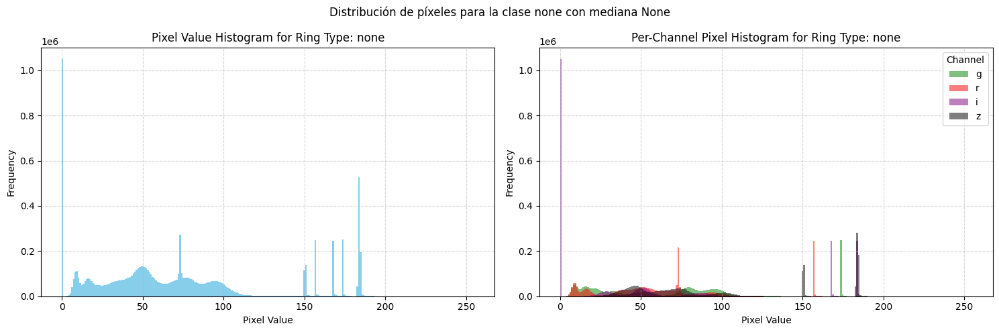


Ring type: inner, Mean: 81.92808675765991, Stddev: 63.91355015905723
Channel g: Mean=77.12308311462402, Stddev=59.59814634582429, Entropy=6.2815
Channel r: Mean=72.29133644104004, Stddev=62.1829261861124, Entropy=6.2668
Channel i: Mean=85.44207038879395, Stddev=72.45904903217208, Entropy=5.3991
Channel z: Mean=92.85585708618164, Stddev=58.50708649537743, Entropy=6.1861


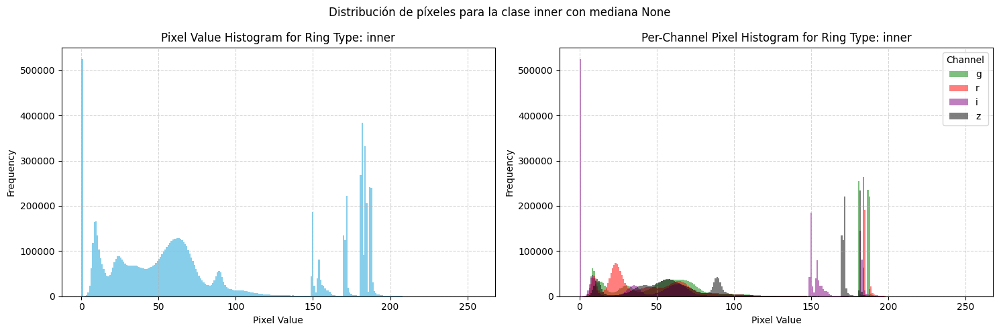

3
Ring type: inner+outer, Mean: 96.01108722686767, Stddev: 70.97658199834228
Channel g: Mean=83.38866996765137, Stddev=69.6284849897591, Entropy=5.7377
Channel r: Mean=104.03261642456054, Stddev=61.9799252873256, Entropy=5.5187
Channel i: Mean=58.6486312866211, Stddev=75.48436717973992, Entropy=2.7657
Channel z: Mean=137.97443122863768, Stddev=48.812173867993764, Entropy=5.5019


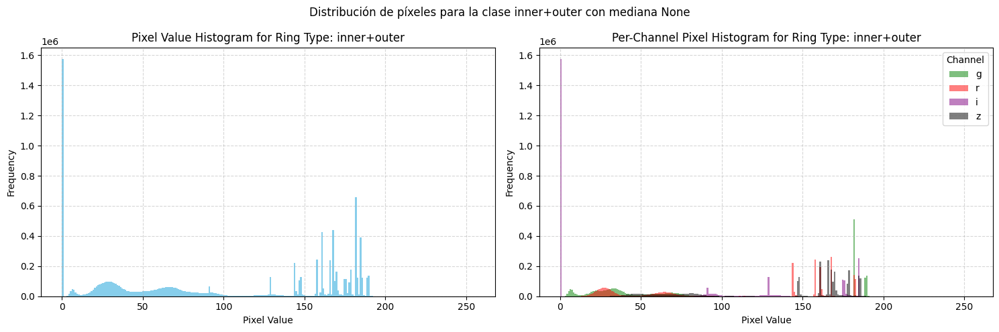


Ring type: outer, Mean: 71.26513481140137, Stddev: 61.748986284611895
Channel g: Mean=78.1269588470459, Stddev=56.82979824550325, Entropy=6.1446
Channel r: Mean=87.90442543029785, Stddev=66.26212867545152, Entropy=5.9118
Channel i: Mean=19.503553009033205, Stddev=30.66620580504214, Entropy=3.3977
Channel z: Mean=99.52560195922851, Stddev=53.75101310218816, Entropy=6.0309


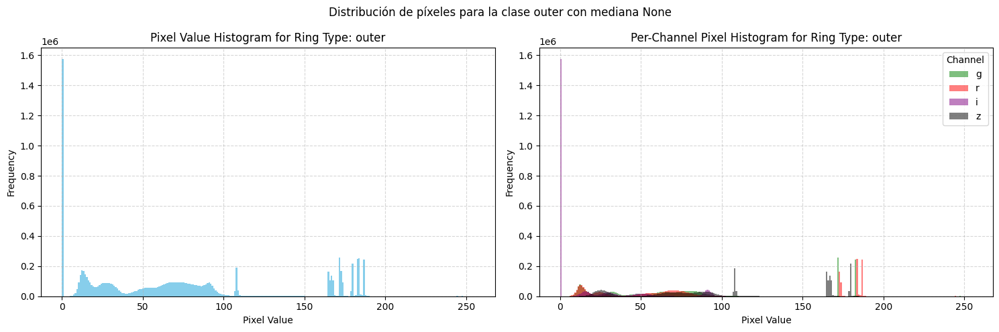

In [119]:
def plot_histograms(dataset_path, samples_per_class=50, transforms=None, med_val=40):
  """ Visualizar los histogramas de cada clase usando un sampleo de imágenes.

  Args:
      dataset_path (Path): Ruta al dataset.
      samples_per_class (int): Número de imágenes a mostrar por clase.
      transforms (callable, optional): Transformaciones a aplicar a las imágenes.
  """
  class_stats = {}

  # Por cada clase
  for class_name in RING_TYPE:
    # Obtener lista de los archivos de la clase
    ring_type_files = list(FITS_PATH.glob(f"*_{class_name}_*.fits"))
    # Obtener una muestra aleatoria
    sample_files = np.random.choice(ring_type_files,
                                    size=min(samples_per_class, len(ring_type_files)),
                                    replace=False)
    # Placeholders y listas
    pixel_values = []
    channel_values = []
    channel_labels = ["g", "r", "i", "z"]
    channel_colors = ["green", "red", "purple", "black"]

    # Por cada archivo fits, abrirlo
    for i, fits_file in enumerate(sample_files):
        with fits.open(fits_file) as hdul:
            data = hdul[0].data # Extraer los datos
            rendered_img = np.zeros((4, 512, 512), dtype=np.uint8)
            # Transformar por cada canal y construir matriz
            for i in range(data.shape[0]):
              img = data[i].astype(np.float64)
              if transforms is not None:
                rendered_img[i] = transforms(img, med_val=med_val)
              else:
                rendered_img[i] = img
            # Vectorizar y guardar valores
            pixel_values.extend(rendered_img.flatten())
            # Extraer valores por cada canal
            for ch in range(rendered_img.shape[0]):
                if len(channel_values) <= ch:
                    channel_values.append([])
                channel_values[ch].extend(rendered_img[ch].flatten())
        print(i, end="\r")

    # Obtener métricas de la imagen conjunta
    pixel_values = np.array(pixel_values)
    mean = np.mean(pixel_values)
    stddev = np.std(pixel_values)
    print(f"\nRing type: {class_name}, Mean: {mean}, Stddev: {stddev}")

    # Obtener métricas por canal
    channel_values = [np.array(ch_vals) for ch_vals in channel_values]
    channel_means = [np.mean(ch_vals) for ch_vals in channel_values]
    channel_stds = [np.std(ch_vals) for ch_vals in channel_values]

    # Obtener la entropía de cada canal usando el histograma
    for idx, (ch_vals, cm, cs) in enumerate(zip(channel_values, channel_means, channel_stds)):
        hist, _ = np.histogram(ch_vals, bins=256, range=(0, 255), density=True) # Histograma
        hist = hist[hist > 0]                   # Ignorar valores en 0
        entropy = -np.sum(hist * np.log2(hist)) # Calcular entropía
        print(f"Channel {channel_labels[idx]}: Mean={cm}, Stddev={cs}, Entropy={entropy:.4f}")

    # Graficar el histograma de la imagen conjunta
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    axs[0].hist(pixel_values, bins=256, color='skyblue')
    axs[0].set_title(f"Pixel Value Histogram for Ring Type: {class_name}")
    axs[0].set_xlabel("Pixel Value")
    axs[0].set_ylabel("Frequency")
    axs[0].grid(True, linestyle='--', alpha=0.5)

    # Graficar los histogramas de cada canal
    for idx, (ch_vals, label, color) in enumerate(zip(channel_values, channel_labels, channel_colors)):
        axs[1].hist(ch_vals, bins=256, color=color, alpha=0.5, label=label)
    axs[1].set_title(f"Per-Channel Pixel Histogram for Ring Type: {class_name}")
    axs[1].set_xlabel("Pixel Value")
    axs[1].set_ylabel("Frequency")
    axs[1].legend(title="Channel")
    axs[1].grid(True, linestyle='--', alpha=0.5)
    plt.suptitle(f"Distribución de píxeles para la clase {class_name} con mediana {med_val}")
    plt.tight_layout()

    plt.show()

plot_histograms(FITS_PATH, samples_per_class=10, transforms=log_n_scale_transform, med_val=None)

Ahora, observando los resultados de los histogramas de cada clase de las imágenes transformadas con mediana modificada a un valor fijo, la disperción está más concentrada alrededor de la mediana fija, mejorando la uniformidad entre canales y la visualización. También se observa la saturación en la banda i.

3
Ring type: none, Mean: 37.818468284606936, Stddev: 14.765107744609923
Channel g: Mean=41.302031707763675, Stddev=12.229261570268594, Entropy=4.6476
Channel r: Mean=41.055855941772464, Stddev=10.978649684885736, Entropy=4.0466
Channel i: Mean=28.309573364257812, Stddev=19.734028218167786, Entropy=3.4970
Channel z: Mean=40.60641212463379, Stddev=9.576458804773099, Entropy=4.2337


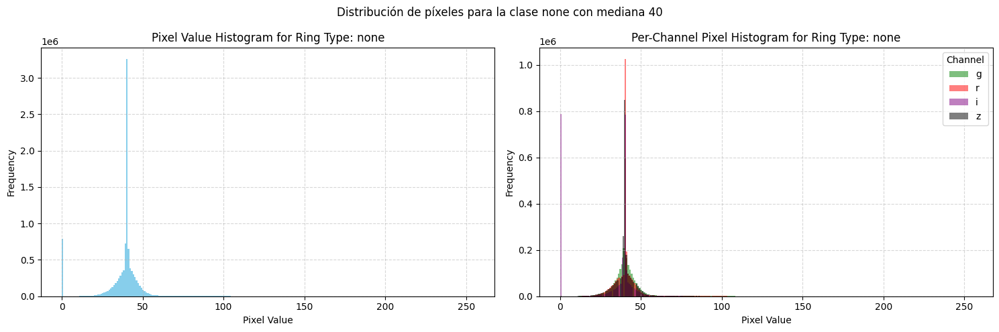

3
Ring type: inner, Mean: 34.99305191040039, Stddev: 17.257264113728073
Channel g: Mean=41.65506820678711, Stddev=12.072058215686075, Entropy=4.5999
Channel r: Mean=41.304530715942384, Stddev=10.461142863985208, Entropy=4.1128
Channel i: Mean=16.349768829345702, Stddev=20.619616418853333, Entropy=2.2570
Channel z: Mean=40.66283988952637, Stddev=6.854068303197782, Entropy=3.3166


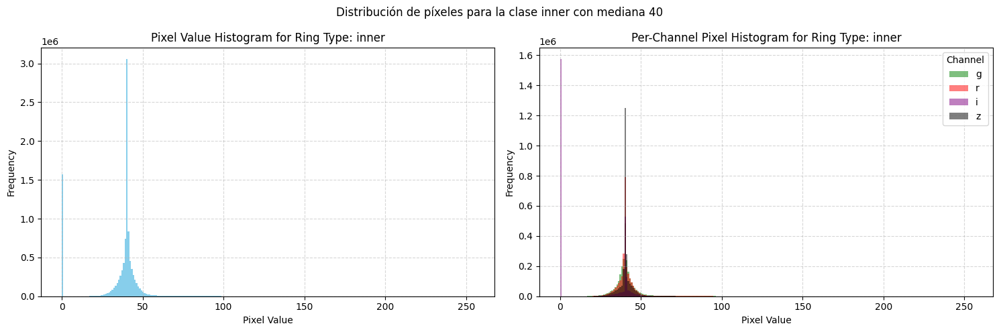

3
Ring type: inner+outer, Mean: 34.853501892089845, Stddev: 17.655094976703115
Channel g: Mean=41.214515686035156, Stddev=11.354413147548842, Entropy=4.5085
Channel r: Mean=41.15401344299316, Stddev=10.826238260513925, Entropy=4.4687
Channel i: Mean=16.365205764770508, Stddev=21.237246195901612, Entropy=2.9297
Channel z: Mean=40.68027267456055, Stddev=9.681501021480086, Entropy=4.3842


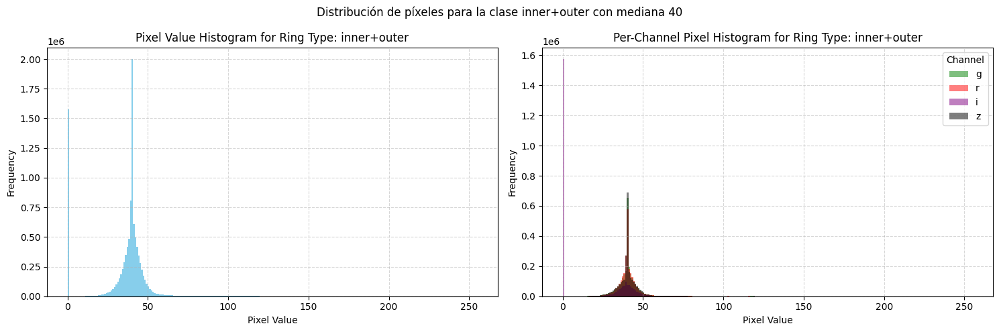


Ring type: outer, Mean: 33.375719928741454, Stddev: 19.83188800576607
Channel g: Mean=42.37869873046875, Stddev=14.605096718267891, Entropy=4.5788
Channel r: Mean=42.13293571472168, Stddev=12.784448426429725, Entropy=4.4256
Channel i: Mean=8.026739883422852, Stddev=16.07190467156044, Entropy=0.8035
Channel z: Mean=40.96450538635254, Stddev=8.95852255213406, Entropy=3.8475


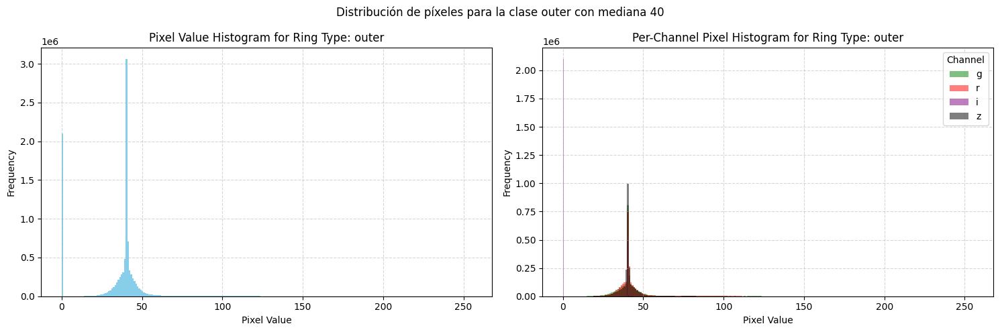

In [120]:
plot_histograms(FITS_PATH, samples_per_class=10, transforms=log_n_scale_transform)

## Análisis de relación señal-ruido

In [ ]:
# analizar la relacion señal-ruido por cada canal y combinacion de los mismos (1, 2, 3 y 4 canales), usar la transformacion log-n con y sin mediana

## Aumentación de datos

In [ ]:
# usar las funciones de pytorch para obtener aumentación de datos y visualizar las imagenes (zoom, flip, rotation, affine)


## Conclusiones

En futuros pasos debemos aplicar mascara para solo enfocarnos en la galaxia...

En el siguiente paso de extraccion de caracteristicas sera necesario evaluar la mediana despues de la transformacion... para mayor distribucion...

la banda i es la mas debil debido a...